# Оптимизация процесса нагрева сплава

В данном проекте решалась задача машинного обучения. \
Созданная модель должна помочь оптимизировать технологический процесс легирования сплава. Обработка осуществляется в несколько  этапов:
* Сталь нагревают до нужной температуры графитовыми электродами и замеряют температуру сплава в начале процесса.
* Водятся легирующие материалы (вводятся сыпучие материалы и проволока). Сплав продувают инертным газом. Во время этого процесса температура на несколько минут повышается
* Такой цикл повторяется до достижения целевого химического состава и оптимальной температуры плавки.

В дальнейшем модель поможет оптимизировать время нагрева сплава до нужной температуры (уменьшить кол-во итераций), в зависимости от количества используемых легирующих материалов и инертного газа.

##  План работы

1. Изучение поставленной задачи
1. Изучение данных
  * Загрузка данных
  * Изучение и анализ данных
    *(изучения таргета, взаимосвязь признаков, поиск кореляции, пути создания новых признаков)*
  * Оценка качества данных и описание 
    *(Оценка полноты данных, а также поиск путей работы с проблемами)*
3. Предобработка
  * Приведение к единому формату
  * Работа с выявленными проблемами и недостатками
4. Обработка
  * Объединение подготовленных таблиц
  * Формирование признаков и таргета
  * Формирование выборок
5. Обучение моделей
  * Можно обучить несколько моделей и проверить их качество с помощью кросс-валидации. Также изучить степень влияния каждого признака на модель. Возможно, после этого придется вернуться на этап анализа данных и подготовки признаков.
  * Тестирование лучшей модели
  * Сравнение с константной моделью.
6. Отчет о проведенном иследовании. Вывод.



## Изучение данных

Данные состоят из файлов, полученных из разных источников:

* `data_arc.csv` — данные об электродах;
* `data_bulk.csv` — данные о подаче сыпучих материалов (объём);
* `data_bulk_time.csv` — данные о подаче сыпучих материалов (время);
* `data_gas.csv` — данные о продувке сплава газом;
* `data_temp.csv` — результаты измерения температуры;
* `data_wire.csv` — данные о проволочных материалах (объём);
* `data_wire_time.csv` — данные о проволочных материалах (время).


Во всех файлах столбец key содержит номер партии. В файлах может быть несколько строк с одинаковым значением key: они соответствуют разным итерациям обработки.

#### Загрузка библиотек

##### Может потребоваться установить следующие библиотеки

In [95]:
#!pip install pandas-profiling
#!pip install --user --upgrade catboost
#!pip install --user --upgrade ipywidgets
#!jupyter nbextension enable --py widgetsnbextension
#!pip install lightgbm
#!pip install shap

##### Загрузка всех библиотек

In [2]:
import pandas as pd
import pandas_profiling
import numpy as np
import random

import matplotlib.pyplot as plt
import seaborn as sns

In [3]:


import catboost
import lightgbm as lgb
from catboost import CatBoostRegressor, metrics, cv
from lightgbm import LGBMRegressor
from catboost import MetricVisualizer


print('Cat Boost version', catboost.__version__)
print('LightGBM version', lgb.__version__) #выводим номер версии

Cat Boost version 1.1.1
LightGBM version 3.3.2


In [4]:
from sklearn.preprocessing import StandardScaler

from sklearn import model_selection
from sklearn.model_selection import TimeSeriesSplit
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

from sklearn.ensemble import  RandomForestRegressor 

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import ElasticNetCV
from sklearn.linear_model import LassoCV

from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import make_scorer

import shap

In [5]:
np.random.seed(151122)

In [6]:
try:
    data_arc = pd.read_csv('final_project\data_arc.csv', parse_dates = ['Начало нагрева дугой', 'Конец нагрева дугой'])
    data_bulk = pd.read_csv('final_project\data_bulk.csv')
    data_bulk_time = pd.read_csv('final_project\data_bulk_time.csv', parse_dates = ['Bulk 1','Bulk 2','Bulk 3','Bulk 4','Bulk 5','Bulk 6','Bulk 7','Bulk 8',
                                                                                    'Bulk 9','Bulk 10','Bulk 11','Bulk 12','Bulk 13','Bulk 14','Bulk 15'])
    data_gas = pd.read_csv('final_project\data_gas.csv')
    data_temp = pd.read_csv('final_project\data_temp.csv', parse_dates = ['Время замера'])
    data_wire = pd.read_csv('final_project\data_wire.csv')
    data_wire_time = pd.read_csv('final_project\data_wire_time.csv', parse_dates = ['Wire 1', 'Wire 2', 'Wire 3', 'Wire 4', 'Wire 5', 'Wire 6', 'Wire 7', 'Wire 8', 'Wire 9'])
except:
    data_arc = pd.read_csv('/datasets/final_steel/data_arc.csv', parse_dates = ['Начало нагрева дугой', 'Конец нагрева дугой'])
    data_bulk = pd.read_csv('/datasets/final_steel/data_bulk.csv')
    data_bulk_time = pd.read_csv('/datasets/final_steel/data_bulk_time.csv', parse_dates = ['Bulk 1','Bulk 2','Bulk 3','Bulk 4','Bulk 5','Bulk 6','Bulk 7','Bulk 8',
                                                                                    'Bulk 9','Bulk 10','Bulk 11','Bulk 12','Bulk 13','Bulk 14','Bulk 15'])
    data_gas = pd.read_csv('/datasets/final_steel/data_gas.csv')
    data_temp = pd.read_csv('/datasets/final_steel/data_temp.csv', parse_dates = ['Время замера'])
    data_wire = pd.read_csv('/datasets/final_steel/data_wire.csv')
    data_wire_time = pd.read_csv('/datasets/final_steel/data_wire_time.csv', parse_dates = ['Wire 1', 'Wire 2', 'Wire 3', 'Wire 4', 'Wire 5', 'Wire 6', 'Wire 7', 'Wire 8', 'Wire 9'])

#### данные об электродах

In [7]:
pandas_profiling.ProfileReport(data_arc)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [8]:
data_arc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14876 entries, 0 to 14875
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   key                   14876 non-null  int64         
 1   Начало нагрева дугой  14876 non-null  datetime64[ns]
 2   Конец нагрева дугой   14876 non-null  datetime64[ns]
 3   Активная мощность     14876 non-null  float64       
 4   Реактивная мощность   14876 non-null  float64       
dtypes: datetime64[ns](2), float64(2), int64(1)
memory usage: 581.2 KB


In [9]:
data_arc.describe()

,key,Активная мощность,Реактивная мощность
count,14876.000000,14876.000000,14876.000000
mean,1615.220422,0.670441,0.452592
std,934.571502,0.408159,5.878702
min,1.000000,0.030002,-715.504924
25%,806.000000,0.395297,0.290991
50%,1617.000000,0.555517,0.415962
75%,2429.000000,0.857034,0.637371
max,3241.000000,3.731596,2.676388


В дата фрейме data_arch содержатся данные о работе электродов : 
* начало и конец периода нагревания - потенциально можно узнать сколько всего по времени нагревалась сталь.
* Активная и реактивная мощность.

Активная мощность -  фактическая, настоящая, полезная, реальная мощность \
Реактивная мощность - переходит в нагрев и излучения, то есть это энергия, которую мы теряем в процессе.

Есть явная аномалия, ведь реактивная мощность не может быть отрицательной.

Данные о времени нагрева необходимо привести к типу datetime.

Так же можно вывести новый признак, объединив информацию об активной и реактивной мощности. 

Создадим параметр "Полная мощность"

$$ S = \sqrt{P^2 + Q^2}$$


Так же умножив после полную мощность на время нагрева можно получить **еще один признак - работу**

#### данные о подаче сыпучих материалов (объём)

In [10]:
pandas_profiling.ProfileReport(data_bulk)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

В таблице очень много пропущенных данных. Какие-то сыпучие материалы не добавлялись в партии сплава, а многие вообще почти не использовались. Эти столбцы лучше не брать для создания признаков, чтобы обучать модель быстрее за счет меньшего количества данных. Влиять на результаты предсказаний они все равно будут мало.

Материалы которые почти не использовались :

balk 1 - 2877 (91.9%)

balk 2 - 3107 (99.3%)

balk 5 - 3052 (97.5%)

balk 6 - 2553 (81.6%)

balk 7 - 3104 (99.2%)

balk 8 - 3128 (> 99.9%)

balk 9 - 3110 (99.4%)

balk 10 - 2953 (94.4%)

balk 11 - 2952 (94.3%)

balk 13 - 3111 (99.4%)

#### данные о подаче сыпучих материалов (время)

In [11]:
pandas_profiling.ProfileReport(data_bulk_time) 

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [12]:
data_bulk_time.loc[ : , ['key', 'Bulk 3', 'Bulk 4', 'Bulk 12', 'Bulk 14', 'Bulk 15']]


,key,Bulk 3,Bulk 4,Bulk 12,Bulk 14,Bulk 15
0,1,NaT,2019-05-03 11:21:30,2019-05-03 11:03:52,2019-05-03 11:03:52,2019-05-03 11:03:52
1,2,NaT,2019-05-03 11:46:38,2019-05-03 11:40:20,2019-05-03 11:40:20,2019-05-03 11:40:20
2,3,NaT,2019-05-03 12:31:06,2019-05-03 12:09:40,2019-05-03 12:09:40,2019-05-03 12:09:40
3,4,NaT,2019-05-03 12:48:43,2019-05-03 12:41:24,2019-05-03 12:41:24,2019-05-03 12:41:24
4,5,NaT,2019-05-03 13:18:50,2019-05-03 13:12:56,2019-05-03 13:12:56,2019-05-03 13:12:56
...,...,...,...,...,...,...
3124,3237,2019-08-31 22:51:28,NaT,2019-08-31 22:46:52,2019-08-31 22:46:52,2019-08-31 22:46:52
3125,3238,2019-08-31 23:39:11,NaT,2019-08-31 23:33:09,2019-08-31 23:33:09,2019-08-31 23:33:09
3126,3239,NaT,NaT,2019-09-01 01:39:41,2019-09-01 01:33:25,2019-09-01 01:33:25
3127,3240,NaT,NaT,NaT,2019-09-01 02:41:27,2019-09-01 02:41:27


Некоторые материалы добавляются всегда вместе. Много пропущенных данных, тк не во все партии добавляются все материалы.

#### данные о продувке сплава газом

In [13]:
pandas_profiling.ProfileReport(data_gas)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

В этой таблице наблюдаются выбросы. В 95% партий использовался объем газа меньше 22.

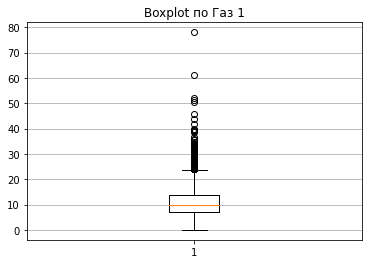

In [14]:
plt.boxplot(data_gas['Газ 1'])
plt.grid(axis='y')
plt.title('Boxplot по Газ 1')
plt.show()

Значения после 50 сильно выбиваются из нормы. Но по данным от производства, данные не являются выбросами, хоть и встречаются нечасто.

#### результаты измерения температуры

In [15]:
pandas_profiling.ProfileReport(data_temp)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

В каждой партии температуру замеряли несколько раз. 

В некоторых партиях отсутствуют замеры температуры (6% датасета), такие данные не подходят для обучения, в них технологический процесс не доведен до конца.

Наблюдаются аномальные значения очень низкой температуры. Основная часть данных наблюдается в пределах 1500-1700 градусов, остальные лучше удалить из выборки.

#### данные о проволочных материалах (объём)

In [16]:
pandas_profiling.ProfileReport(data_wire)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

здесь также много пропущенных значений, которые можно удалить по анологии с с данными о сыпучих материалах

wire_3-wire_9 в более, чем 97% случаем не используются

#### данные о проволочных материалах (время)

In [17]:
pandas_profiling.ProfileReport(data_wire_time)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Вывод

Прежде чем приступить к обучению моделей необходимо:
*    Убрать данные с пропущенными значениями температуры.
*    Данные о дате и времени перевести в datetime (сделано уже при загрузке).
*    Проверить мультиколлинеарность признаков. 
*    Убрать неинформативные признаки.
*    Масштабировать количественные признаки.

## Предобработка данных

In [18]:
data_arc.columns = ['key', 'start','end', 'a_power', 'r_power']
data_bulk.columns = ['key', 'bulk_1','bulk_2','bulk_3','bulk_4','bulk_5','bulk_6','bulk_7','bulk_8',
                     'bulk_9','bulk_10','bulk_11','bulk_12','bulk_13','bulk_14','bulk_15']
data_bulk_time.columns = ['key', 'bulk_1','bulk_2','bulk_3','bulk_4','bulk_5','bulk_6','bulk_7','bulk_8',
                     'bulk_9','bulk_10','bulk_11','bulk_12','bulk_13','bulk_14','bulk_15']
data_gas.columns = ['key', 'gas']
data_temp.columns = ['key', 'time','temp']
data_wire.columns = ['key','wire_1','wire_2','wire_3','wire_4','wire_5','wire_6','wire_7','wire_8','wire_9']
data_wire_time.columns = ['key','wire_1','wire_2','wire_3','wire_4','wire_5','wire_6','wire_7','wire_8','wire_9']

### Признаки

 #### `data_arc`

In [19]:
# Избаляемся от аномалии. Реактивная мощность не может быть отрицательной.
data_arc = data_arc.query('r_power > 0')

Приступим к предобработке первой таблицы

Создадим новые признаки: 
* время нагрева
* полную мощности
* найдем **А** - работу для каждой партии

In [20]:
data_arc['time'] = data_arc['end'] - data_arc['start']


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [21]:
data_arc['time'].head(5)

0   0 days 00:03:48
1   0 days 00:03:05
2   0 days 00:02:52
3   0 days 00:06:05
4   0 days 00:02:28
Name: time, dtype: timedelta64[ns]

In [22]:
#data_arc = data_arc.groupby('key').agg(time = ('time', 'sum'), power = ('a_power', 'sum'), r_power = ('r_power', 'sum'))

In [23]:
#data_arc['full'] = np.sqrt(data_arc['power']**2 + data_arc['r_power']**2)

In [24]:
def operation (time, power):
    operation_r = power * time.seconds
    return operation_r

In [25]:
#data_arc['A'] = data_arc.apply(lambda x: operation(x['time'],x['full']),axis=1)

In [26]:
#data_arc['time'] = data_arc['time'].dt.seconds

In [27]:
#data_arc

In [28]:
data_arc['full'] = np.sqrt(data_arc['a_power']**2 + data_arc['r_power']**2)


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


In [29]:
data_arc.head(5)

,key,start,end,a_power,r_power,time,full
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.976059,0.687084,0 days 00:03:48,1.193639
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.805607,0.520285,0 days 00:03:05,0.959010
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.744363,0.498805,0 days 00:02:52,0.896038
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,1.659363,1.062669,0 days 00:06:05,1.970470
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.692755,0.414397,0 days 00:02:28,0.807239


In [30]:
data_arc = data_arc.groupby('key').agg(time = ('time', 'sum'), full = ('full', 'mean'))

In [31]:
data_arc.head(5)

,time,full
key,,
1,0 days 00:18:18,1.165279
2,0 days 00:13:31,0.912304
3,0 days 00:10:55,0.597907
4,0 days 00:12:21,0.953741
5,0 days 00:14:29,1.008939


In [32]:
data_arc['A'] = data_arc.apply(lambda x: operation(x['time'],x['full']),axis=1)

In [33]:
data_arc.head(5)

,time,full,A
key,,,
1,0 days 00:18:18,1.165279,1279.476327
2,0 days 00:13:31,0.912304,739.878624
3,0 days 00:10:55,0.597907,391.628975
4,0 days 00:12:21,0.953741,706.721780
5,0 days 00:14:29,1.008939,876.768387


In [34]:
data_arc['time'] = data_arc['time'].dt.seconds

In [35]:
data_arc

,time,full,A
key,,,
1,1098,1.165279,1279.476327
2,811,0.912304,739.878624
3,655,0.597907,391.628975
4,741,0.953741,706.721780
5,869,1.008939,876.768387
...,...,...,...
3237,909,0.968996,880.817803
3238,546,0.898847,490.770657
3239,1216,0.701485,853.006159


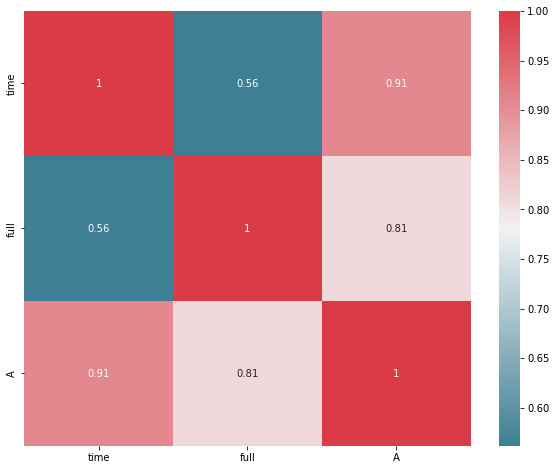

In [36]:
corr = abs(data_arc.corr())

f, ax = plt.subplots(figsize=(10, 8))

cmap = sns.diverging_palette(220, 10, as_cmap=True)

ax = sns.heatmap(
    corr,          
    cmap=cmap,
    annot=True)

значения таблицы `arc_data` сильно коррелируют между собой. Поэтому лучше сократь количество признаков. Достаточно оставить только параметр работы

  #### `data_bulk`

Здесь мы избавляемся от записях о материалах, которые почти не используют

In [37]:
#data_bulk = data_bulk.drop(['bulk_1','bulk_2','bulk_5','bulk_6','bulk_7','bulk_8', 'bulk_9','bulk_10','bulk_11','bulk_13'], axis=1)

In [38]:
data_bulk = data_bulk.fillna(0)

In [39]:
data_bulk

,key,bulk_1,bulk_2,bulk_3,bulk_4,bulk_5,bulk_6,bulk_7,bulk_8,bulk_9,bulk_10,bulk_11,bulk_12,bulk_13,bulk_14,bulk_15
0,1,0.0,0.0,0.0,43.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,206.0,0.0,150.0,154.0
1,2,0.0,0.0,0.0,73.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,206.0,0.0,149.0,154.0
2,3,0.0,0.0,0.0,34.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,205.0,0.0,152.0,153.0
3,4,0.0,0.0,0.0,81.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,207.0,0.0,153.0,154.0
4,5,0.0,0.0,0.0,78.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,203.0,0.0,151.0,152.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3124,3237,0.0,0.0,170.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,252.0,0.0,130.0,206.0
3125,3238,0.0,0.0,126.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,254.0,0.0,108.0,106.0
3126,3239,0.0,0.0,0.0,0.0,0.0,114.0,0.0,0.0,0.0,0.0,0.0,158.0,0.0,270.0,88.0
3127,3240,0.0,0.0,0.0,0.0,0.0,26.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,192.0,54.0


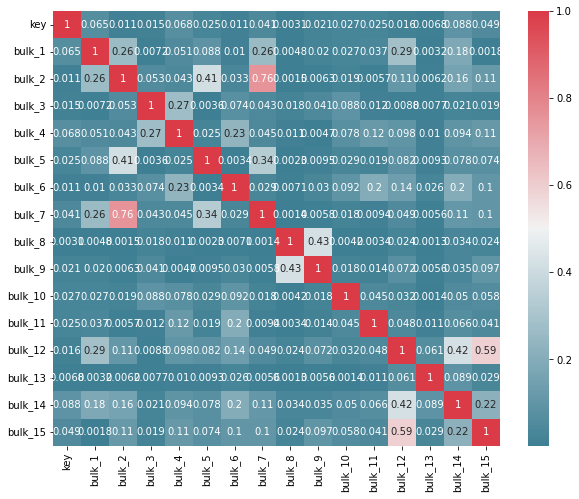

In [40]:
corr = abs(data_bulk.corr())

f, ax = plt.subplots(figsize=(10, 8))

cmap = sns.diverging_palette(220, 10, as_cmap=True)

ax = sns.heatmap(
    corr,          
    cmap=cmap,
    annot=True)

 #### `data_wire`

In [41]:
#data_wire = data_wire.drop(['wire_3','wire_4','wire_5','wire_6','wire_7','wire_8', 'wire_9'], axis=1)

In [42]:
data_wire = data_wire.fillna(0)

In [43]:
data_wire

,key,wire_1,wire_2,wire_3,wire_4,wire_5,wire_6,wire_7,wire_8,wire_9
0,1,60.059998,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2,96.052315,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,3,91.160157,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,4,89.063515,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,5,89.238236,9.11456,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
3076,3237,38.088959,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3077,3238,56.128799,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3078,3239,143.357761,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3079,3240,34.070400,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0


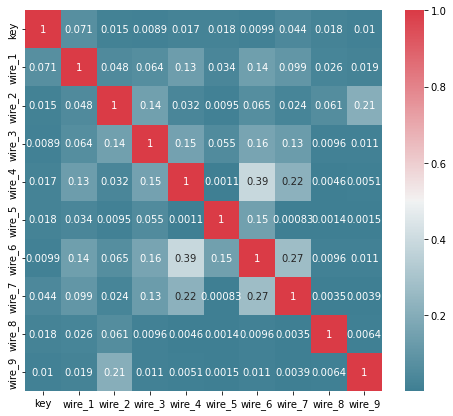

In [44]:
corr = abs(data_wire.corr())

f, ax = plt.subplots(figsize=(8, 7))

cmap = sns.diverging_palette(220, 10, as_cmap=True)

ax = sns.heatmap(
    corr,          
    cmap=cmap,
    annot=True)

### Целевой признак

Приступим к обработке данных температуры. 

Эти значения являются нашим целевым признаком, поэтому мы не можем использовать таблицу с неполной информацией. Если в какой-то партии был только один замер температуры - технологический процесс не выполнен полностью, и использовать эти объекты мы не можем.

In [45]:
# находим пропущенные значения
data_temp_null = data_temp[data_temp.isnull().any(axis=1)]

Стоит ознакомиться с пропущенными значениями.

In [46]:
data_temp_null

,key,time,temp
12268,2500,2019-08-06 03:24:43,NaN
12269,2500,2019-08-06 03:25:16,NaN
12270,2500,2019-08-06 03:28:21,NaN
12272,2501,2019-08-06 04:01:59,NaN
12273,2501,2019-08-06 04:14:35,NaN
...,...,...,...
15901,3240,2019-09-01 03:35:16,NaN
15903,3241,2019-09-01 04:16:12,NaN
15904,3241,2019-09-01 04:22:39,NaN
15905,3241,2019-09-01 04:33:42,NaN


Создается впечатление, что, начиная с партии 2500, все значения неполные. 

In [47]:
data_temp_not_null = data_temp.copy()
# соберем отдельно записи, где нет пропусков, чтобы убедиться - в этих партиях больше одной записи
data_temp_not_null = data_temp_not_null.drop(data_temp_null.index, axis=0)
# посчитаем количество записей для каждого `кеу` и отсортируем по значению
need_delete = data_temp_not_null['key'].value_counts().sort_index()
# теперь получим список с партиями, где замеров температуры было меньше 2. Номер партии - индекс записи
need_delete = need_delete[need_delete < 2]

In [48]:
need_delete

195     1
279     1
2500    1
2501    1
2502    1
       ..
3237    1
3238    1
3239    1
3240    1
3241    1
Name: key, Length: 741, dtype: int64

In [49]:
# избавляемся от записей, где в партии меньше 2 замеров температуры
data_temp = data_temp[data_temp['key'].isin(need_delete.index)== False]

In [50]:
data_temp

,key,time,temp
0,1,2019-05-03 11:16:18,1571.0
1,1,2019-05-03 11:25:53,1604.0
2,1,2019-05-03 11:29:11,1618.0
3,1,2019-05-03 11:30:01,1601.0
4,1,2019-05-03 11:30:39,1613.0
...,...,...,...
12262,2498,2019-08-06 02:19:26,1593.0
12263,2498,2019-08-06 02:25:31,1594.0
12264,2499,2019-08-06 02:40:25,1569.0
12265,2499,2019-08-06 02:54:24,1604.0


Целевым признаком будет только последняя температура. Промежуточные значения в начале процесса неизвестны, поэтому использовать данные о них для обучения некорректно

Можно сохранить информацию о количестве этапов нагрева в партии.

In [51]:
iterat= data_temp['key'].value_counts()
iterat = iterat.sort_index()

In [52]:
iterat

1       5
2       6
3       5
4       3
5       2
       ..
2495    3
2496    4
2497    2
2498    5
2499    3
Name: key, Length: 2475, dtype: int64

In [53]:
data_temp = data_temp.groupby(by = 'key').agg(['first', 'last']).reset_index()

In [54]:
data_temp.head(5)

key                time                        temp        
                    first                last   first    last
0   1 2019-05-03 11:16:18 2019-05-03 11:30:39  1571.0  1613.0
1   2 2019-05-03 11:37:27 2019-05-03 11:59:12  1581.0  1602.0
2   3 2019-05-03 12:13:17 2019-05-03 12:34:57  1596.0  1599.0
3   4 2019-05-03 12:52:57 2019-05-03 12:59:25  1601.0  1625.0
4   5 2019-05-03 13:23:19 2019-05-03 13:36:01  1576.0  1602.0

In [55]:
data_temp.columns = data_temp.columns.droplevel()
data_temp.columns = ['key', 'time_1', 'time_2', 'temp_1', 'temp_2']
data_temp = data_temp[['key', 'temp_1', 'temp_2']]

In [56]:
data_temp

,key,temp_1,temp_2
0,1,1571.0,1613.0
1,2,1581.0,1602.0
2,3,1596.0,1599.0
3,4,1601.0,1625.0
4,5,1576.0,1602.0
...,...,...,...
2470,2495,1570.0,1591.0
2471,2496,1554.0,1591.0
2472,2497,1571.0,1589.0
2473,2498,1591.0,1594.0


### Объединение таблицы

In [57]:
iterat = iterat.reset_index()

In [58]:
iterat

,index,key
0,1,5
1,2,6
2,3,5
3,4,3
4,5,2
...,...,...
2470,2495,3
2471,2496,4
2472,2497,2
2473,2498,5


In [59]:
data = (data_temp.merge(data_arc['A'], on='key', how='inner')
        .merge(data_wire, on='key', how='inner')
        .merge(data_bulk, on='key', how='inner')
        .merge(data_gas, on='key', how='inner'))

In [60]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2329 entries, 0 to 2328
Data columns (total 29 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   key      2329 non-null   int64  
 1   temp_1   2329 non-null   float64
 2   temp_2   2329 non-null   float64
 3   A        2329 non-null   float64
 4   wire_1   2329 non-null   float64
 5   wire_2   2329 non-null   float64
 6   wire_3   2329 non-null   float64
 7   wire_4   2329 non-null   float64
 8   wire_5   2329 non-null   float64
 9   wire_6   2329 non-null   float64
 10  wire_7   2329 non-null   float64
 11  wire_8   2329 non-null   float64
 12  wire_9   2329 non-null   float64
 13  bulk_1   2329 non-null   float64
 14  bulk_2   2329 non-null   float64
 15  bulk_3   2329 non-null   float64
 16  bulk_4   2329 non-null   float64
 17  bulk_5   2329 non-null   float64
 18  bulk_6   2329 non-null   float64
 19  bulk_7   2329 non-null   float64
 20  bulk_8   2329 non-null   float64
 21  bulk_9   2329 

In [61]:
data = data[data['gas'].notna()]

In [62]:
data['iterat'] = iterat['key']

In [63]:
data

,key,temp_1,temp_2,A,wire_1,wire_2,wire_3,wire_4,wire_5,wire_6,...,bulk_8,bulk_9,bulk_10,bulk_11,bulk_12,bulk_13,bulk_14,bulk_15,gas,iterat
0,1,1571.0,1613.0,1279.476327,60.059998,0.00000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,206.0,0.0,150.0,154.0,29.749986,5
1,2,1581.0,1602.0,739.878624,96.052315,0.00000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,206.0,0.0,149.0,154.0,12.555561,6
2,3,1596.0,1599.0,391.628975,91.160157,0.00000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,205.0,0.0,152.0,153.0,28.554793,5
3,4,1601.0,1625.0,706.721780,89.063515,0.00000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,207.0,0.0,153.0,154.0,18.841219,3
4,5,1576.0,1602.0,876.768387,89.238236,9.11456,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,203.0,0.0,151.0,152.0,5.413692,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2324,2495,1570.0,1591.0,720.626482,89.150879,0.00000,0.0,0.0,0.0,0.0,...,0.0,0.0,90.0,0.0,256.0,0.0,129.0,223.0,7.125735,6
2325,2496,1554.0,1591.0,792.268493,114.179527,0.00000,0.0,0.0,0.0,0.0,...,0.0,0.0,122.0,0.0,256.0,0.0,129.0,226.0,9.412616,6
2326,2497,1571.0,1589.0,547.191525,94.086723,9.04800,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,230.0,0.0,124.0,226.0,6.271699,7
2327,2498,1591.0,1594.0,621.562327,118.110717,0.00000,0.0,0.0,0.0,0.0,...,0.0,0.0,101.0,0.0,206.0,0.0,129.0,207.0,14.953657,5


In [64]:
data = data.fillna(0)

In [65]:
data = data.drop(['key'], axis=1)

## Создание выборок

Разделим датасет на тренировочный и тестовый. Тестовый используем только в конце для моделей, показавших лучшие результаты

In [66]:
train, test = train_test_split(data, test_size = .25, random_state = 151122)

In [67]:
train.shape

(1746, 29)

Промасштабируем признаки

In [68]:
numeric = data.columns.tolist()
numeric = [i for i in numeric if i not in ('temp_2')]
scaler = StandardScaler()
scaler.fit(train[numeric])

train[numeric] = scaler.transform(train[numeric])
test[numeric] = scaler.transform(test[numeric])

Отделим целевой признак

In [69]:
x_train = train.drop(['temp_2'], axis = 1)
y_train = train['temp_2']

x_test = test.drop(['temp_2'], axis = 1)
y_test = test['temp_2']

## Обучение

### CatBoostRegressor

In [70]:
regressor = CatBoostRegressor(verbose=False, random_state=151122, iterations=4500, learning_rate =0.01, early_stopping_rounds=100)
cv_catboost = (cross_val_score(regressor, 
                             x_train, 
                             y_train, 
                             cv=7,
                             scoring='neg_mean_absolute_error').mean() * -1)

In [71]:
print('Mean MAE =', cv_catboost)

Mean MAE = 6.039995860582195


In [72]:
regressor.fit(x_train, y_train) 

#### CatBoost оценка признаков

Проанализируем как признаки влияют на результат предсказаний

In [73]:
explainer = shap.Explainer(regressor)
shap_values = explainer(x_train)

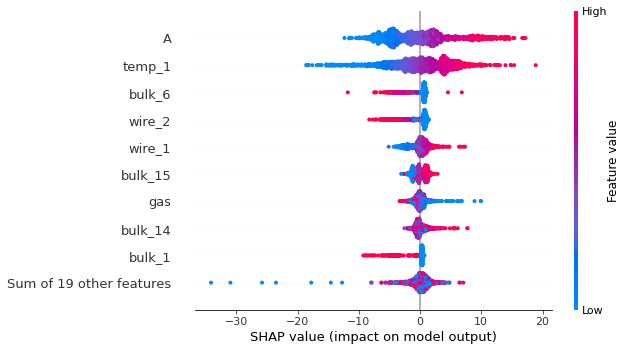

In [74]:
shap.plots.beeswarm(shap_values)

Наибольшее влияние на предсказание оказывают параметры: 
* начальная температура нагрева
* работа
* объем проволочных материалов

На четвертом месте по влиянию - количество запусков (итераций нагрева)

### Изменения

Возникло предположение, что признак `iterat` может негативно влиять на обучение модели. Была попытка обучить модель с теми же гиперпараметрами, но без этого признака. Результат ухудшился на .03. 

Также в процессе предобработки мы удаляли признаки о сыпучих и проволочных материалах, которые редко использовались в изготовлении сплава. Обучив модель вместе с этими признаками результат улучшился на 0.15, поэтому было принято решение обучить другие модели с их использованием.

### LGBMRegressor

In [75]:
params = {
    'max_depth': [5, 10, 15],
    'n_estimators': [100, 300, 500],
    'feature_fraction': [0.6, 0.7, 0.8, 0.9, 0.95]   }

dtrain = lgb.Dataset(x_train, label = y_train)

In [102]:
lgb_model = LGBMRegressor(boosting_type='gbdt',
                          objective = 'regression',
                          metric = 'auc',
                          learning_rate = 0.01,
                          num_leaves = 35,
                          random_state = 151122)

In [ ]:
gsearch = GridSearchCV(lgb_model, param_grid=params, scoring='neg_mean_absolute_error', cv=3)
gsearch.fit(x_train, y_train) 

In [78]:
print (gsearch.best_score_)

-6.1537900356411805


### RandomForest

In [79]:
parameter_space = {'bootstrap': [True, False],
'max_depth': [10, 20, 30, 40, 50, 60, 70, 80, 90, 100],
'max_features': ['auto', 'sqrt'],
'min_samples_leaf': [1, 2, 4],
'min_samples_split': [2, 5, 10],
'n_estimators': [200, 400, 600, 800, 1000, 2000]
}

In [80]:
ensemble = RandomForestRegressor(random_state=151122)

In [81]:
model_rf = model_selection.RandomizedSearchCV(
    estimator =ensemble,
    param_distributions= parameter_space,
    n_iter=10,
    scoring = mean_absolute_error,
    n_jobs = -1,
    cv = 4
)

In [82]:
%%time
model_rf.fit(x_train,y_train)
print(model_rf.best_params_)

One or more of the test scores are non-finite: [nan nan nan nan nan nan nan nan nan nan]


{'n_estimators': 800, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': 'sqrt', 'max_depth': 100, 'bootstrap': False}
Wall time: 1min 3s


### ElasticNetCV

In [83]:
tscv = TimeSeriesSplit(n_splits=5)

In [84]:
model_EN = ElasticNetCV( cv=tscv)
model_EN.fit(x_train, y_train)

ElasticNetCV(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None))

In [85]:
predict_EN = model_EN.predict(x_test)

In [86]:
MAE_EN = mean_absolute_error(predict_EN, y_test)
print('MAE на тестовой выборке =', MAE_EN)

MAE на тестовой выборке = 6.833020725883675


### LassoCV

In [87]:
model_lasso = LassoCV(cv=tscv)
model_lasso.fit(x_train, y_train)

LassoCV(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None))

In [88]:
predict_lasso = model_lasso.predict(x_test)

In [89]:
MAE_lasso = mean_absolute_error(predict_lasso, y_test)
print('MAE на тестовой выборке =', MAE_lasso)

MAE на тестовой выборке = 6.783882365663572


## Тест

Проверим на тестовой выборке модель, показавшую лучший результат

#### CatBoost

In [96]:
cat_model = CatBoostRegressor(verbose=False, random_state=151122, iterations=5000, learning_rate =0.01, early_stopping_rounds=100).fit(x_train, y_train)

In [91]:
y_predict_cat = cat_model.predict(x_test)
MAE_cat = mean_absolute_error(y_predict_cat, y_test)
print('MAE на тестовой выборке =', MAE_cat)

MAE на тестовой выборке = 6.184807317379106


#### Сравнение с константной моделью

In [92]:
from sklearn.dummy import DummyRegressor
reg = DummyRegressor()

In [93]:
reg.fit(x_train, y_train)

DummyRegressor()

In [94]:
y_predict_reg = reg.predict(x_test)
MAE_reg = mean_absolute_error(y_predict_reg, y_test)
print('MAE на тестовой выборке =', MAE_reg)

MAE на тестовой выборке = 8.319528685021766


## Отчет

Нужный результат (Значение МАЕ на тестовой выборке < 8) был достигнут и обученные модели дают хорошие результаты как на обучающей выборке, так и на тестовой. \
Ход работы двигался в соответствии с планом, но в процессе были внесены некоторые изменения.

В результате изучения данных были найдены проблемы - пропущенные значения, отсутствие замеров температуры для нескольких партий. \
Данные были приведены к нужному типу.

Были созданы новые признаки, ускорившие скорость обучения:
* работа (А). Были удалены из выборок активная, реактивная мощности, время старта и окончания нагрева.
* Количество итераций нагрева сплава. 

Изучение моделей показало, что эти признаки улучшают качество предсказаний. \
В процессе предобработки были убраны данные о сыпучих и проволочных материалах, которые мало использовались в процессе изготовления сплава. \
После обучения модели с этими признаками и без них, оказалось, что эти параметры улучшают результаты модели. Предположение об их неинформативности не подтвердилось.
Результат при использовании этих признаков улучшается для моделей в среднем на 0.15 

Предположение, что признак iterat может негативно влиять на обучение модели. Была попытка обучить модель с теми же гиперпараметрами, но без этого признака. Результат ухудшился на .03.


После признаки были  объединены в одну таблицу, промасштабированы, затем разделены на признаки и целевой признак.

В итоге для обучения модели использовались агрегированные для каждой партии данные о выполняемой работе для нагрева сплава, времени нагрева, количестве итераций.
Также : количестве сыпучих и проволочных материалов, объеме газа. 

За время работы были выделены некоторые проблемы в данных, вызывающие сложности в работе. \
Данные о времени загрузке материалов не использовались, так как они не синхронизированы для таблиц.  \
Для партий от 2500-ой есть только один замер температуры, те отсутствует целевой признак.


Были обучены регрессионные модели: CatBoost, LGBM, RandomForest, ElasticNetCV, LassoCV. С помощью кросс-валидации. Модели с лучшими результатами были проверены на тестовой выборке.

**Вывод** \
Лучший результат показала модель CatBoost.

CatBoostRegressor(verbose=True, random_state=151122, iterations=5000, learning_rate =0.01, early_stopping_rounds=100)
* результат кросс-валидации на обучающей выборке - **MAE = 6.03**
* результат на тестовой выборке - **MAE = 6.18**

Константная модель показала результат 8.31 на тестовой выборке. Результат обученой модели значительно лучше.
